# UTSA - CS 5243 - Computer Vision: Assignment-2

**Mao - Christopher - zbq615**


## Learning Objectives


*   Understand the process of image filtering. Create different filters and apply them on images.
*   Implement the operation of blending two images using Laplacian Pyramid Blending technique.


In [ ]:
# Add only your imports here
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Assume that the data files are in the following folder -- THIS WILL BE USED BY THE TA
basePath = "/content/drive/My Drive/Colab Notebooks/Computer Vision/Data/"

#Filtering (50 points)

## Create own filtering function (40 points)

Create your own function that takes as input -
1.   RGB image of size (X,Y)
2.   kernel of size (K,L), where K and L are both odd

Padding - implement the "mirror" technique to avoid the loss of pixels on the image boundary.

Note: you are supposed to create your own filtering function and are not allowed to use any filtering or convolution functions available in any libraries.

In [ ]:
# Create your own filtering function
def myFilter(img, kernel):
  rows, cols, channels = img.shape
  kernel_rows, kernel_cols = kernel.shape
  padded_img = np.pad(array=img, pad_width=((kernel_rows//2, kernel_rows//2), (kernel_cols//2, kernel_cols//2), (0, 0)), mode='symmetric')
  new_img = np.zeros_like(img)

  for i in range(rows):
    for j in range(cols):
      for c in range(channels):
        new_pixel_value = 0
        for ki in range(kernel_rows):
          for kj in range(kernel_cols):
            padded_row = i + ki
            padded_col = j + kj
            new_pixel_value += padded_img[padded_row, padded_col, c]*kernel[ki, kj]
        if new_pixel_value < 0:
          new_pixel_value = 0
        elif new_pixel_value > 255:
          new_pixel_value = 255
        new_img[i, j, c] = new_pixel_value

  return new_img

##Create filter kernels and perform filtering (10 points)

Use the above created function on a given set of images. Create a kernel for the each of the following filters and perform filtering. Compare the filtered image with the openCV's filter2D function by drawing them side-by-side. Do this for all the non-mask images and plot them in a separate row. Grid size for each filter will be 3 columns (left - your result, middle - original image, right - openCV result) x 3 rows (number of images).

Create a new code block for the following:

*   Box blur filter of size (5,7)
*   Gaussian blur filter of size (5,5)
*   Sharpening filter of size (3,3)
*   Sobel Horizontal filter of size (3,3)
*   Sobel Vertical filter of size (3,3)

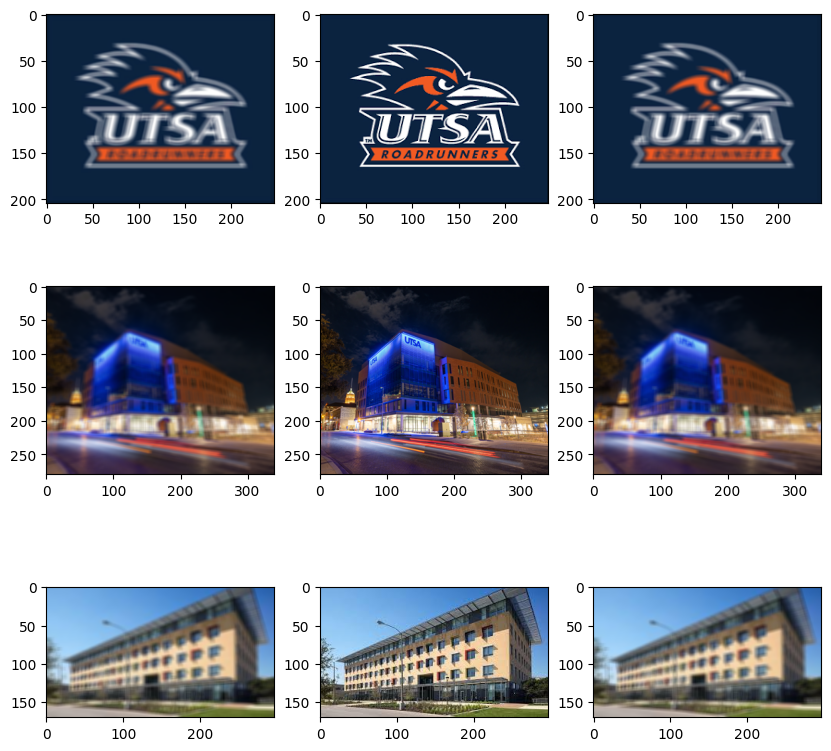

In [ ]:
# Box blur filter of size (5,7)

# Get the list of image files in the Data folder
image_files = ['utsa-logo.png', 'utsa-sp1.png', 'utsa-npb.png']

# Read the images
images = []
for file in image_files:
  image_path = os.path.join(basePath, file)
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  images.append(img)

box_blur_kernel = np.ones((5, 7)) / 35
images_with_box_blur = [myFilter(img, box_blur_kernel) for img in images]
images_with_box_blur_opencv = [cv2.filter2D(src=img, ddepth=-1, kernel=box_blur_kernel) for img in images]

# Display the images on a 3x3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
  axes[i, 0].imshow(images_with_box_blur[i])
  axes[i, 1].imshow(images[i])
  axes[i, 2].imshow(images_with_box_blur_opencv[i])
plt.show()

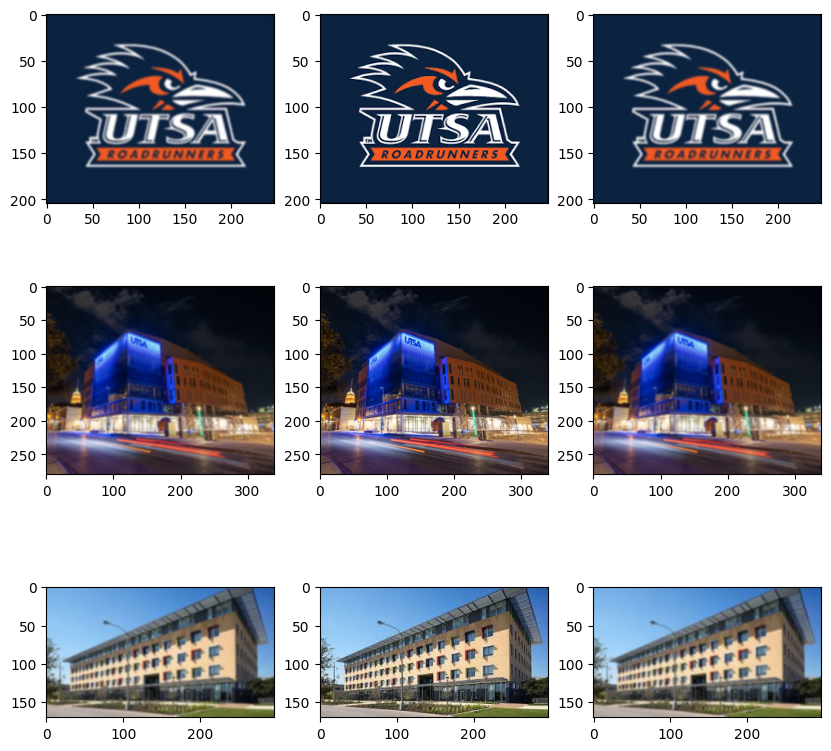

In [ ]:
# Gaussian blur filter of size (5,5)
gaussian_kernel = np.array([[1, 4, 6, 4, 1],
                            [4, 16, 24, 16, 4],
                            [6, 24, 36, 24, 6],
                            [4, 16, 24, 16, 4],
                            [1, 4, 6, 4, 1]]) / 256

images_with_gaussian_blur = [myFilter(img, gaussian_kernel) for img in images]
images_with_gaussian_blur_opencv = [cv2.filter2D(src=img, ddepth=-1, kernel=gaussian_kernel) for img in images]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
  axes[i, 0].imshow(images_with_gaussian_blur[i])
  axes[i, 1].imshow(images[i])
  axes[i, 2].imshow(images_with_gaussian_blur_opencv[i])
plt.show()

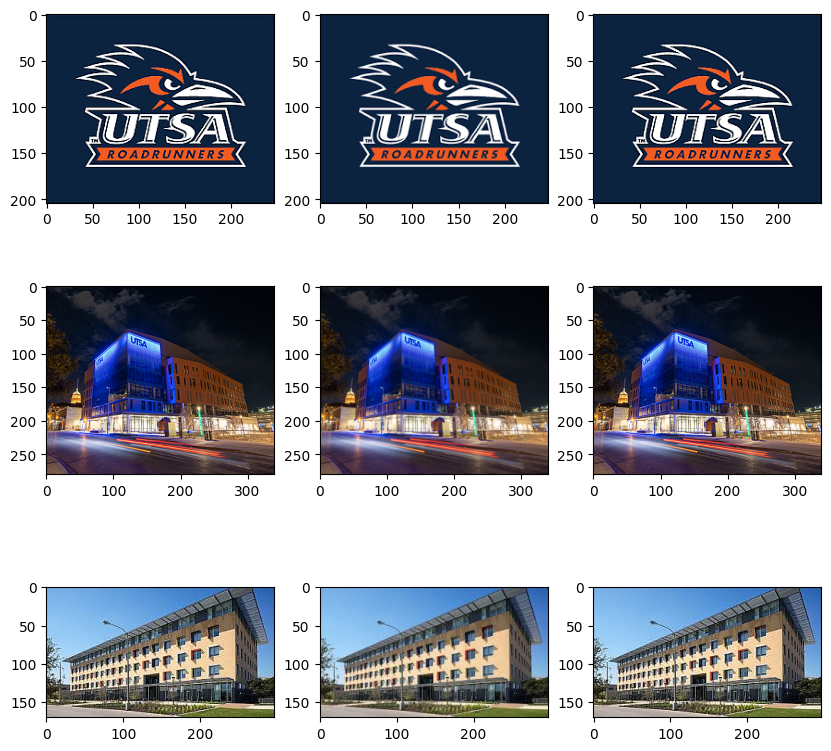

In [ ]:
# Sharpening filter of size (3,3)
sharpen_kernel = np.zeros((3,3))
sharpen_kernel[1,1] = 2
sharpen_kernel = sharpen_kernel - np.ones((3,3))/3**2

images_with_sharpen = [myFilter(img, sharpen_kernel) for img in images]
images_with_sharpen_opencv = [cv2.filter2D(src=img, ddepth=-1, kernel=sharpen_kernel) for img in images]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
  axes[i, 0].imshow(images_with_sharpen[i])
  axes[i, 1].imshow(images[i])
  axes[i, 2].imshow(images_with_sharpen_opencv[i])
plt.show()


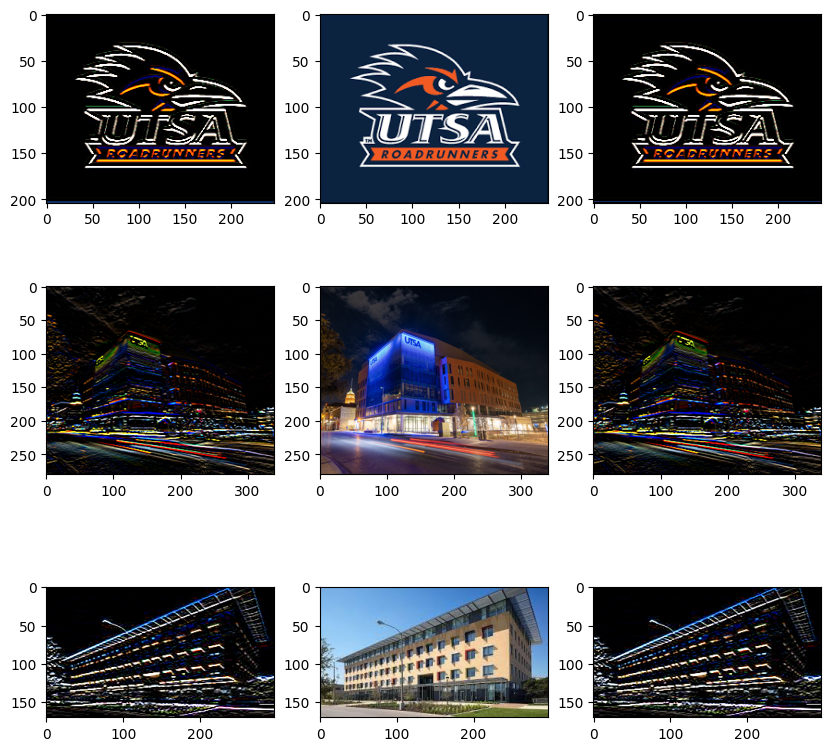

In [ ]:
# Sobel horizontal filter of size (3,3)
sobel_horizonatal_kernel = np.array([[1, 2, 1],
                                     [0, 0, 0],
                                     [-1, -2, -1]])

images_with_sobel_horizontal = [myFilter(img, sobel_horizonatal_kernel) for img in images]
images_with_sobel_horizontal_opencv = [cv2.filter2D(src=img, ddepth=-1, kernel=sobel_horizonatal_kernel) for img in images]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
  axes[i, 0].imshow(images_with_sobel_horizontal[i])
  axes[i, 1].imshow(images[i])
  axes[i, 2].imshow(images_with_sobel_horizontal_opencv[i])
plt.show()

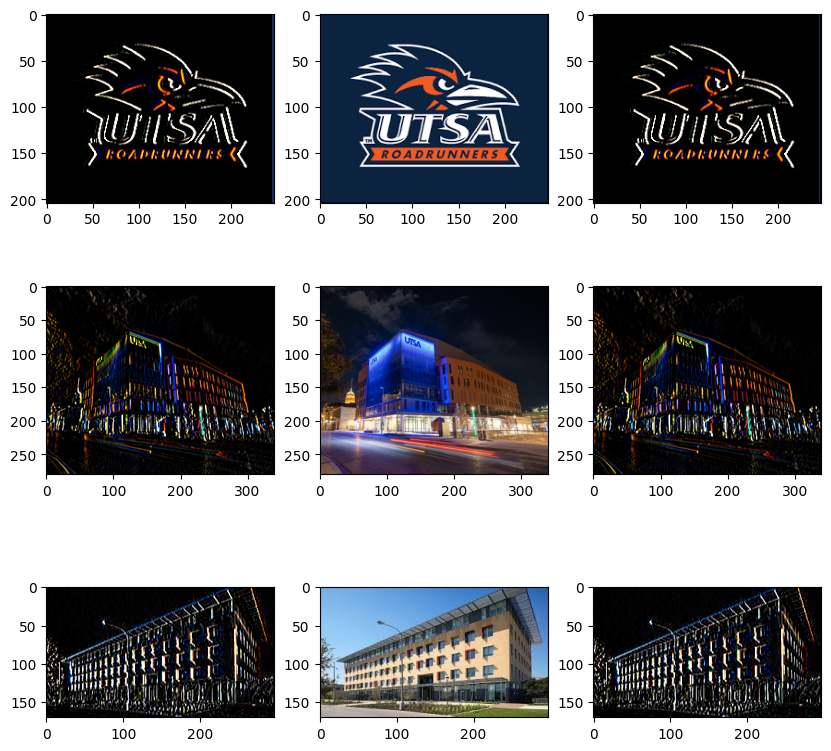

In [ ]:
# Sobel vertical filter of size (3,3)
sobel_vertical_kernel = np.array([[1, 0, -1],
                                  [2, 0, -2],
                                  [1, 0, -1]])

images_with_sobel_vertical = [myFilter(img, sobel_vertical_kernel) for img in images]
images_with_sobel_vertical_opencv = [cv2.filter2D(src=img, ddepth=-1, kernel=sobel_vertical_kernel) for img in images]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
  axes[i, 0].imshow(images_with_sobel_vertical[i])
  axes[i, 1].imshow(images[i])
  axes[i, 2].imshow(images_with_sobel_vertical_opencv[i])
plt.show()

# Laplacian Pyramid Blending (75 points)


## Create own function for "slicing" of two images (05 points)

Implement a function that blends two given images using the "Slicing" operation. The function should plot a (1x3) figure with images in order - Image-1, Image-2, Sliced Result.

In the lecture, we used left half from image-1 and right half from image-2. Instead, you should use a mask (black & white image) during the merge step. Black indicates take the pixels from image-1 and white indicates take the pixel from image-2.


In [ ]:
# Create your own function for blending two images using the "Slicing" operation
def slicing(A,B,mask):
  sliced_result = np.zeros_like(A)
  for i in range(A.shape[0]):
    for j in range(A.shape[1]):
      for k in range(A.shape[2]):
        if np.all(mask[i, j, k] == 0):  # Black: Take pixel from img1
          sliced_result[i, j, k] = A[i, j, k]
        else:  # White: Take pixel from img2
          sliced_result[i, j, k] = B[i, j, k]

  fig, axes = plt.subplots(1, 3)
  axes[0].imshow(A)
  axes[0].set_title("Image 1")
  axes[1].imshow(B)
  axes[1].set_title("Image 2")
  axes[2].imshow(sliced_result)
  axes[2].set_title("Sliced Result")
  plt.show()
  return sliced_result

## Create own function for "Laplacian Pyramid Blending" of two images (50 points)

Implement a function that blends two given images using the Laplacian Image Pyramid Blending approach.

Your function should take as input 2 images and an option to decide on the number of levels for Laplacian Pyramid. Assume that both the images are of the same size.

As part of your results, you should show two things. show the Gaussian Pyramid and Laplacian Pyramid for each of the images in the image pair. You should also show the blend results at each level. Check the lecture slides for the results of the pair "apple & orange".

In the lecture, we used left half from image-1 and right half from image-2. Instead, you should use a mask (black & white image) during the merge step. Black indicates take the pixels from image-1 and white indicates take the pixel from image-2.

Please look at the class slides for the algorithm and the corresponding recorded video for explanation.

In [ ]:
# Create your own function for Laplacian Pyramid Blending of two images
def pyramidBlending(A,B,mask,N):
  # Generate Gaussian pyramids for both images
  gaussian_pyramid_A = gaussian_pyramid(A,N)
  gaussian_pyramid_B = gaussian_pyramid(B,N)

  # Generate Laplacian pyramids for both images
  laplacian_pyramid_A = laplacian_pyramid(A,N)
  laplacian_pyramid_B = laplacian_pyramid(B,N)

  # Blend the Laplacian pyramids using the mask
  blended_pyramid = []
  for i in range(N):
    # cv2.resize(src = image, dsize = (width = cols, height = rows))
    resized_mask = cv2.resize(mask, (laplacian_pyramid_A[i].shape[1], laplacian_pyramid_A[i].shape[0]))
    sliced_level = np.zeros_like(laplacian_pyramid_A[i])

    for j in range(laplacian_pyramid_A[i].shape[0]):
      for k in range(laplacian_pyramid_A[i].shape[1]):
        for c in range(laplacian_pyramid_A[i].shape[2]):
          if resized_mask[j,k,c] == 0:
            sliced_level[j, k, c] = laplacian_pyramid_A[i][j, k, c]
          else:
            sliced_level[j, k, c] = laplacian_pyramid_B[i][j, k, c]
    blended_pyramid.append(sliced_level)

  # Reconstruct the blended image from the blended Laplacian pyramid
  blended_image = reconstruct_from_laplacian(blended_pyramid)
  return blended_image, gaussian_pyramid_A, gaussian_pyramid_B, laplacian_pyramid_A, laplacian_pyramid_B, blended_pyramid

def gaussian_pyramid(img, num_levels):
  pyramid = [img]
  for i in range(num_levels - 1):
    img = cv2.pyrDown(img)
    pyramid.append(img)
  return pyramid

def laplacian_pyramid(img, num_levels):
  pyramid = []
  for i in range(num_levels - 1):
    downsized = cv2.pyrDown(img) # Blur then downsample
    # 1. Convolve with Gaussian kernel, 2. Downsize by 1/2 in each dimension by removing every even-#'d row and col
    upsized = cv2.pyrUp(downsized) # Upsample then blur
    # 1. Upsize by 1/2 in each dimension and interpolate with 0's, 2. Convolve with Gaussian kernel (multiplied by 4) to approximate values of missing pixels
    laplacian = img - upsized
    pyramid.append(laplacian)
    img = downsized
  pyramid.append(img)
  return pyramid

def reconstruct_from_laplacian(pyramid):
  reconstructed_images = []
  reconstructed_images.append(pyramid[-1])
  reconstructed_image = pyramid[-1]
  for i in range(len(pyramid)-2, -1, -1):
    reconstructed_image = cv2.pyrUp(reconstructed_image)
    reconstructed_image = reconstructed_image + pyramid[i]
    reconstructed_images.append(reconstructed_image)
  reconstructed_images.reverse()
  return reconstructed_images

## Perform blending for give image pairs (20 points)

Call both the above created functions on all (5) pairs of images and show the results.

1.   apple & orange
2.   apple & orange with diagonal mask
3.   apple2 & orange2 with circular mask
4.   ghost-rider & nicolas-cage
5.   quinn & robbie


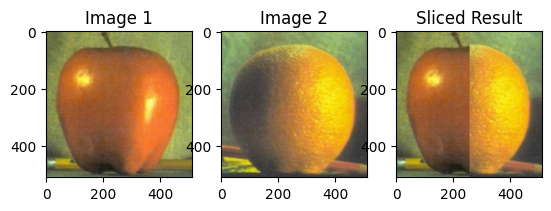

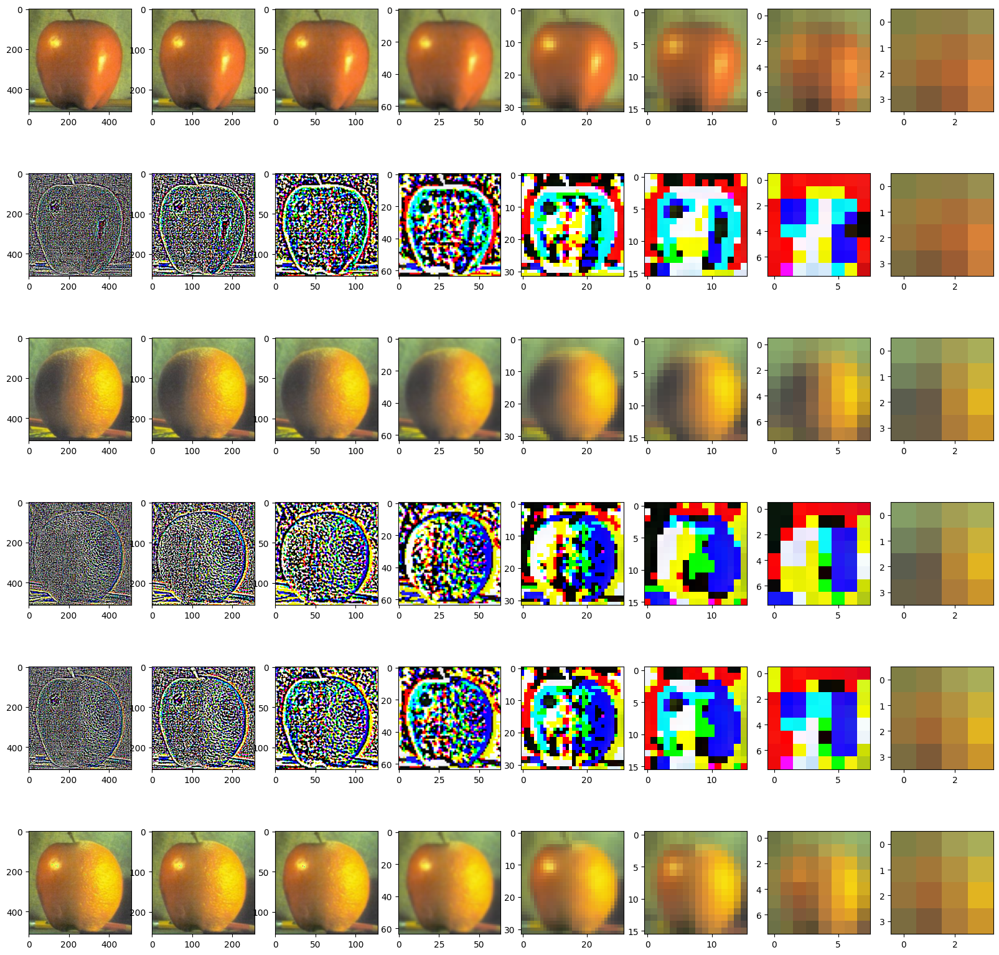

In [ ]:
# Apply the above created function on all pairs of images and show the results

# Read apple and orange
apple = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'apple.png')), cv2.COLOR_BGR2RGB)
orange = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'orange.png')), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(basePath,'apple-orange-mask.png'))
slicing(apple, orange, mask)

blended_images, gaussian_pyramid_A, gaussian_pyramid_B, laplacian_pyramid_A, laplacian_pyramid_B, blended_pyramid = pyramidBlending(apple, orange, mask, 8)
fig, axes = plt.subplots(6,8,figsize=(20,20))
for i in range(8):
  axes[0, i].imshow(gaussian_pyramid_A[i])
  axes[1, i].imshow(laplacian_pyramid_A[i])
  axes[2, i].imshow(gaussian_pyramid_B[i])
  axes[3, i].imshow(laplacian_pyramid_B[i])
  axes[4, i].imshow(blended_pyramid[i])
  axes[5, i].imshow(blended_images[i])
plt.show()




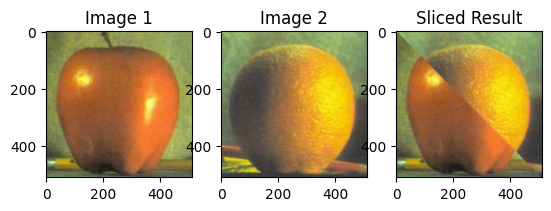

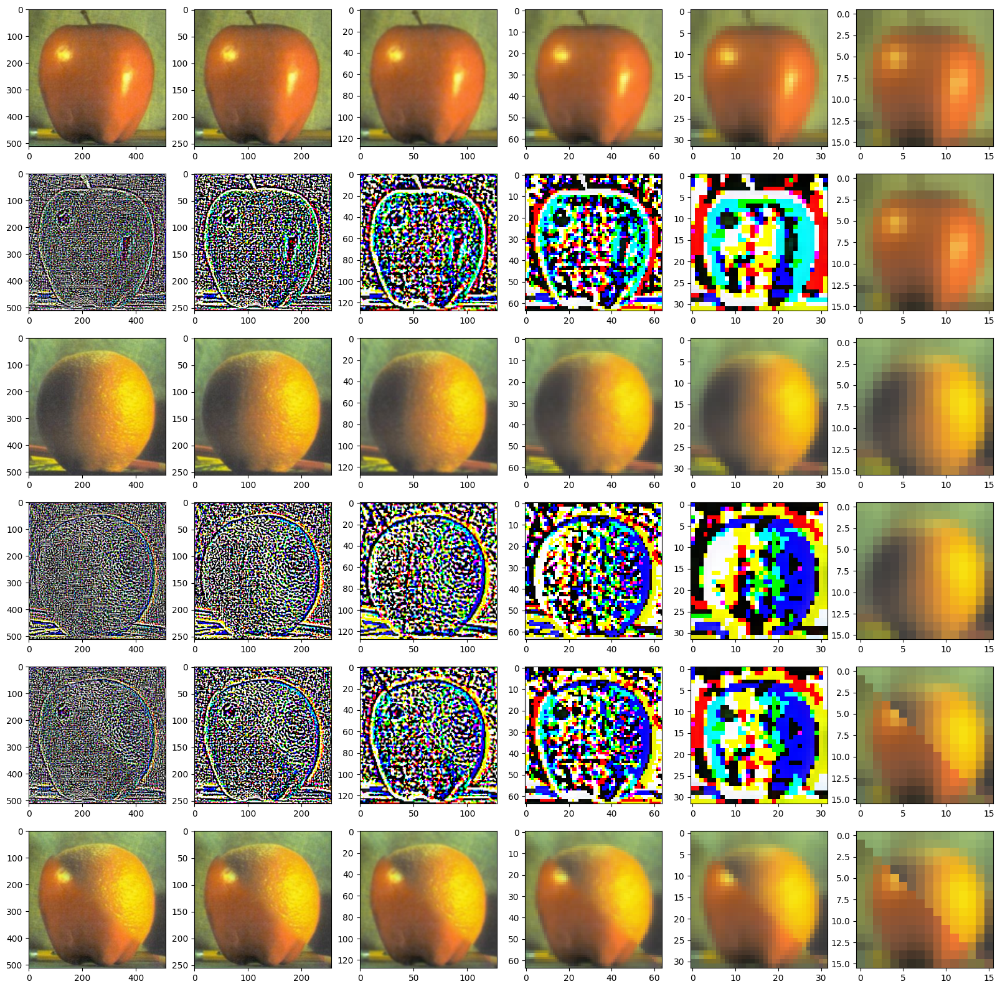

In [ ]:
apple = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'apple.png')), cv2.COLOR_BGR2RGB)
orange = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'orange.png')), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(basePath,'apple-orange-mask-diagonal.png'))
slicing(apple, orange, mask)

blended_images, gaussian_pyramid_A, gaussian_pyramid_B, laplacian_pyramid_A, laplacian_pyramid_B, blended_pyramid = pyramidBlending(apple, orange, mask, 6)
fig, axes = plt.subplots(6,6,figsize=(20,20))
for i in range(6):
  axes[0, i].imshow(gaussian_pyramid_A[i])
  axes[1, i].imshow(laplacian_pyramid_A[i])
  axes[2, i].imshow(gaussian_pyramid_B[i])
  axes[3, i].imshow(laplacian_pyramid_B[i])
  axes[4, i].imshow(blended_pyramid[i])
  axes[5, i].imshow(blended_images[i])
plt.show()


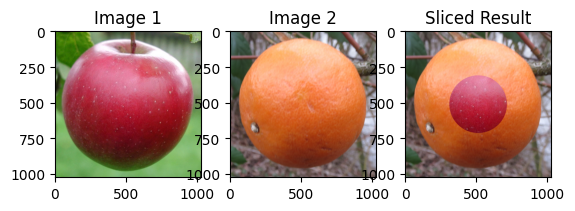

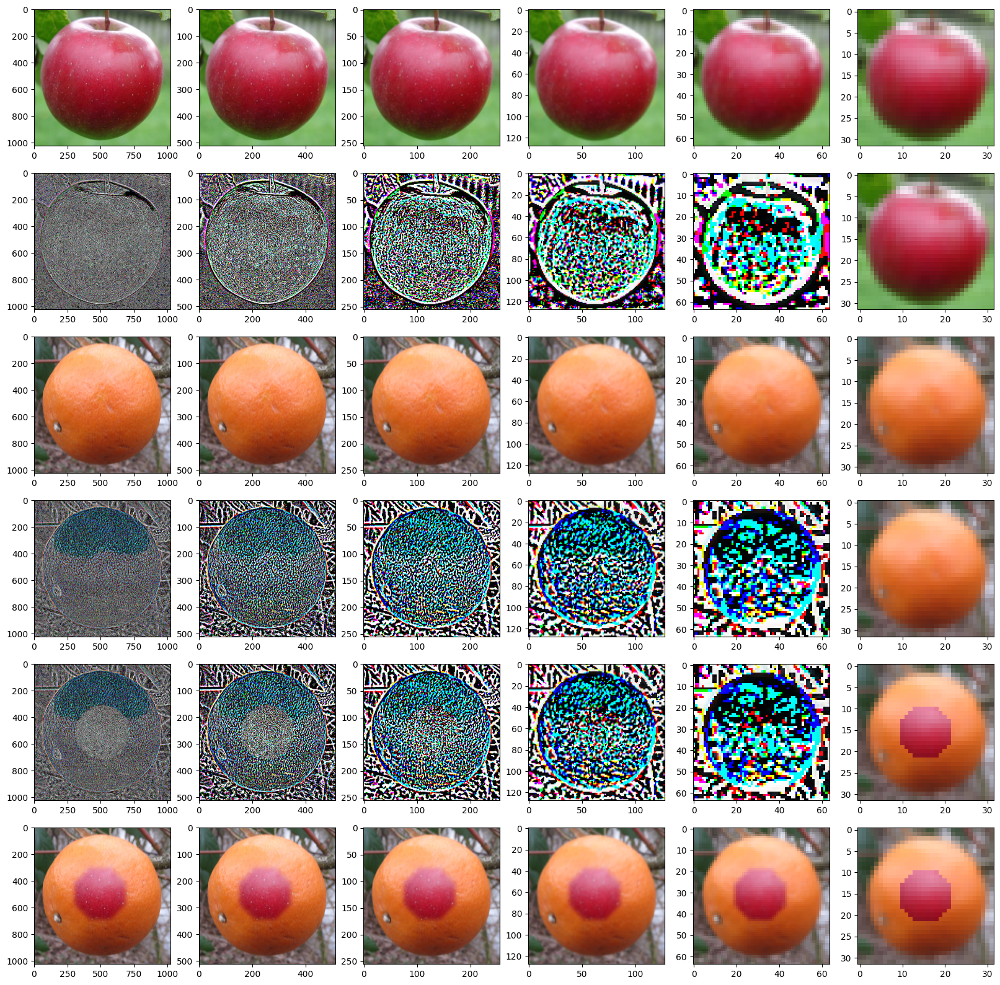

In [ ]:
apple = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'apple2.png')), cv2.COLOR_BGR2RGB)
orange = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'orange2.png')), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(basePath,'apple2-orange2-mask.png'))
slicing(apple, orange, mask)

blended_images, gaussian_pyramid_A, gaussian_pyramid_B, laplacian_pyramid_A, laplacian_pyramid_B, blended_pyramid = pyramidBlending(apple, orange, mask, 6)
fig, axes = plt.subplots(6,6,figsize=(20,20))
for i in range(6):
  axes[0, i].imshow(gaussian_pyramid_A[i])
  axes[1, i].imshow(laplacian_pyramid_A[i])
  axes[2, i].imshow(gaussian_pyramid_B[i])
  axes[3, i].imshow(laplacian_pyramid_B[i])
  axes[4, i].imshow(blended_pyramid[i])
  axes[5, i].imshow(blended_images[i])
plt.show()

# Why blue artifacts when 8 levels?

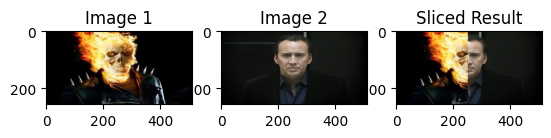

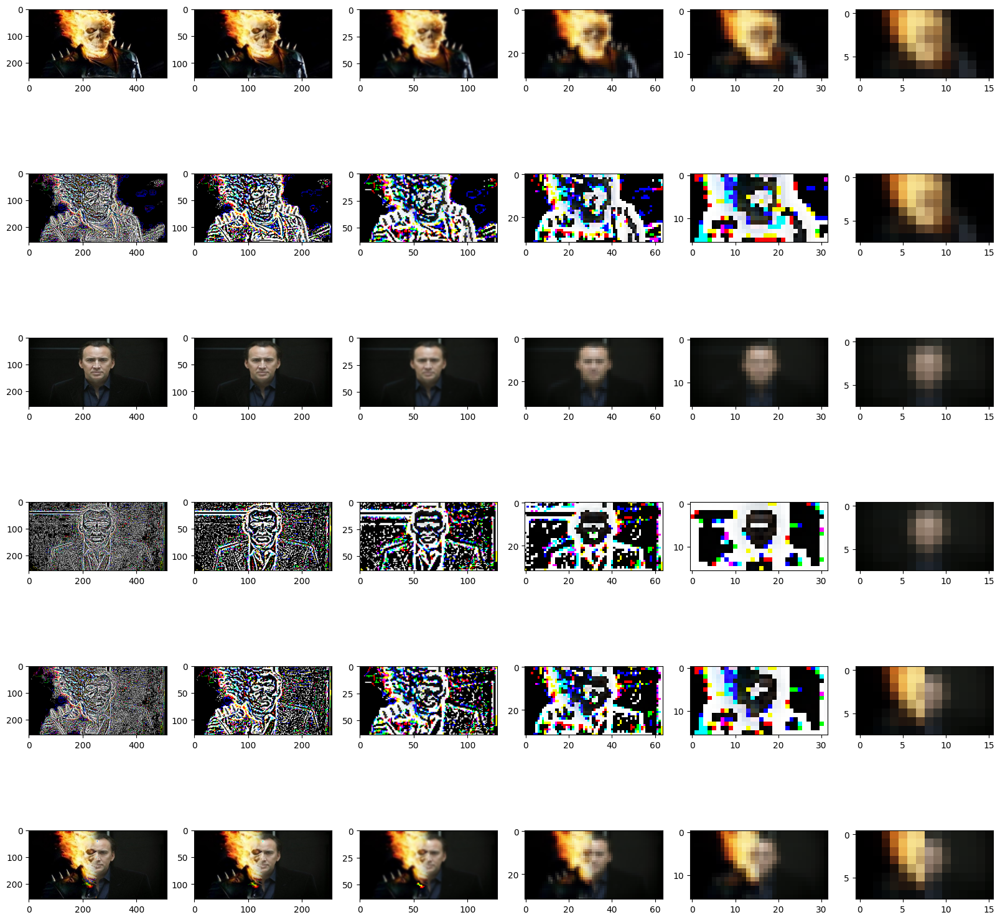

In [ ]:
A = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'ghost-rider.jpg')), cv2.COLOR_BGR2RGB)
B = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'nicolas-cage.jpg')), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(basePath,'ghost-rider-nicolas-cage-mask.jpg'))
slicing(A, B, mask)

blended_images, gaussian_pyramid_A, gaussian_pyramid_B, laplacian_pyramid_A, laplacian_pyramid_B, blended_pyramid = pyramidBlending(A, B, mask, 6)
fig, axes = plt.subplots(6,6,figsize=(20,20))
for i in range(6):
  axes[0, i].imshow(gaussian_pyramid_A[i])
  axes[1, i].imshow(laplacian_pyramid_A[i])
  axes[2, i].imshow(gaussian_pyramid_B[i])
  axes[3, i].imshow(laplacian_pyramid_B[i])
  axes[4, i].imshow(blended_pyramid[i])
  axes[5, i].imshow(blended_images[i])
plt.show()

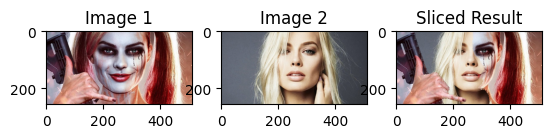

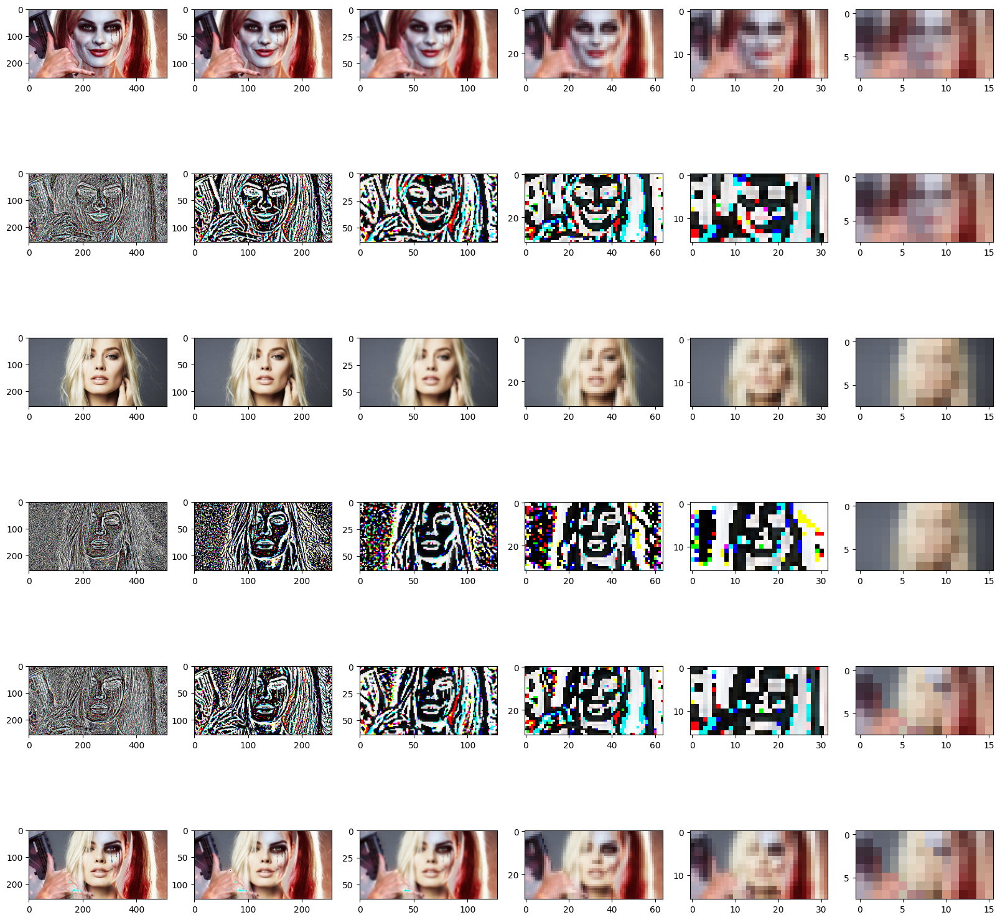

In [ ]:
A = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'quinn.jpg')), cv2.COLOR_BGR2RGB)
B = cv2.cvtColor(cv2.imread(os.path.join(basePath, 'robbie.jpg')), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(basePath,'quinn-robbie-mask.jpg'))
slicing(A, B, mask)

blended_images, gaussian_pyramid_A, gaussian_pyramid_B, laplacian_pyramid_A, laplacian_pyramid_B, blended_pyramid = pyramidBlending(A, B, mask, 6)
fig, axes = plt.subplots(6,6,figsize=(20,20))
for i in range(6):
  axes[0, i].imshow(gaussian_pyramid_A[i])
  axes[1, i].imshow(laplacian_pyramid_A[i])
  axes[2, i].imshow(gaussian_pyramid_B[i])
  axes[3, i].imshow(laplacian_pyramid_B[i])
  axes[4, i].imshow(blended_pyramid[i])
  axes[5, i].imshow(blended_images[i])
plt.show()

#Submission Instructions



1.   Complete all tasks above
2.   Export this notebook as .ipynb
      (File > Download as ipynb)
4.   Upload the .ipynb file on Blackboard



##Rubric

*   (40 points) Implement Filtering Function
*   (10 points) Apply different filters to the above function
*   (05 points) Implement Slicing Function
*   (50 points) Implement Laplacian Pyramid Blending Function
*   (20 points) Apply above blending functions on different image pairs